# Visualize FID Preprocessing: Real vs Synthetic Images

This notebook visualizes real and synthetic image pairs before they're sent to FID computation.
It helps verify that preprocessing is consistent and identify any issues.


In [2]:
import torch
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path
import torchvision.transforms as transforms
from torchvision.utils import make_grid
import glob
from typing import List, Tuple


In [3]:
# Configuration
validation_images_dir = Path("/home/vito/ibrahimm/projects/AI4Health/notebooks/ibrahimm/Generative-Models/images/Chest_XRay/RoentGen-v2/output/roentgen_v2_baseline/validation_images/step_2500")
num_pairs_to_show = 5  # Number of image pairs to display
gpu_dir = validation_images_dir / "gpu_0"  # Use gpu_0 for visualization


In [9]:
def load_image_pair(gpu_dir: Path, idx: int) -> Tuple[Image.Image, Image.Image, str]:
    """Load a pair of real and synthetic images."""
    synth_path = gpu_dir / f"synthetic_{idx:06d}.png"
    real_path = gpu_dir / f"real_{idx:06d}.png"
    prompt_path = gpu_dir / f"prompt_{idx:06d}.txt"
    
    synth_img = Image.open(synth_path).convert("RGB") if synth_path.exists() else None
    real_img = Image.open(real_path).convert("RGB") if real_path.exists() else None
    
    prompt = ""
    if prompt_path.exists():
        with open(prompt_path, 'r') as f:
            prompt = f.read().strip()
    
    return real_img, synth_img, prompt


In [4]:
def crop_black_borders(img: Image.Image, threshold: int = 5) -> Image.Image:
    """Crop black borders from image."""
    img_array = np.array(img)
    non_black = np.any(img_array > threshold, axis=2)
    if non_black.any():
        rows = np.where(non_black.any(axis=1))[0]
        cols = np.where(non_black.any(axis=0))[0]
        if len(rows) > 0 and len(cols) > 0:
            top, bottom = rows[0], rows[-1] + 1
            left, right = cols[0], cols[-1] + 1
            return img.crop((left, top, right, bottom))
    return img


In [5]:
def preprocess_for_fid(img: Image.Image, crop_borders: bool = False) -> torch.Tensor:
    """Preprocess image exactly as done before FID computation."""
    # Crop borders if requested (for real images)
    if crop_borders:
        img = crop_black_borders(img)
    
    # Transform: Resize to 512x512, then ToTensor
    transform = transforms.Compose([
        transforms.Resize((512, 512), interpolation=transforms.InterpolationMode.BILINEAR),
        transforms.ToTensor(),  # Converts to [0, 1] range
    ])
    
    return transform(img)  # Shape: (3, 512, 512), range: [0, 1]


In [6]:
def preprocess_for_inception(img_tensor: torch.Tensor) -> torch.Tensor:
    """Preprocess image as done inside FID computation (Inception v3 preprocessing)."""
    import torch.nn.functional as F
    
    # Normalize to [0, 1] if needed (should already be [0, 1])
    if img_tensor.min() < 0:
        img_tensor = (img_tensor + 1.0) / 2.0
    
    # Resize to 299x299 for Inception
    img_tensor = F.interpolate(
        img_tensor.unsqueeze(0), 
        size=(299, 299), 
        mode="bilinear", 
        align_corners=False
    ).squeeze(0)
    
    # Convert grayscale to RGB if needed
    if img_tensor.shape[0] == 1:
        img_tensor = img_tensor.repeat(3, 1, 1)
    
    # Normalize for Inception (ImageNet stats)
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    img_tensor = (img_tensor - mean) / std
    
    return img_tensor  # Shape: (3, 299, 299), normalized


In [7]:
# Find available image pairs
synth_files = sorted(gpu_dir.glob("synthetic_*.png"))
real_files = sorted(gpu_dir.glob("real_*.png"))

print(f"Found {len(synth_files)} synthetic images and {len(real_files)} real images")
print(f"Will display {min(num_pairs_to_show, len(synth_files))} pairs")


Found 163 synthetic images and 163 real images
Will display 5 pairs


In [10]:
# Load and preprocess image pairs
image_pairs = []
for idx in range(min(num_pairs_to_show, len(synth_files))):
    real_img, synth_img, prompt = load_image_pair(gpu_dir, idx)
    
    if real_img is None or synth_img is None:
        continue
    
    # Preprocess as done before FID
    real_tensor = preprocess_for_fid(real_img, crop_borders=True)  # Crop borders for real
    synth_tensor = preprocess_for_fid(synth_img, crop_borders=False)  # No cropping for synthetic
    
    # Also get original loaded images (before preprocessing)
    real_original = Image.open(gpu_dir / f"real_{idx:06d}.png").convert("RGB")
    synth_original = Image.open(gpu_dir / f"synthetic_{idx:06d}.png").convert("RGB")
    
    image_pairs.append({
        'idx': idx,
        'real_original': real_original,
        'synth_original': synth_original,
        'real_processed': real_tensor,
        'synth_processed': synth_tensor,
        'prompt': prompt,
    })


In [11]:
# Display statistics
print("=" * 80)
print("IMAGE STATISTICS BEFORE FID PREPROCESSING")
print("=" * 80)

for pair in image_pairs:
    real_t = pair['real_processed']
    synth_t = pair['synth_processed']
    
    print(f"\nPair {pair['idx']}:")
    print(f"  Real:    shape={real_t.shape}, min={real_t.min():.4f}, max={real_t.max():.4f}, mean={real_t.mean():.4f}, std={real_t.std():.4f}")
    print(f"  Synthetic: shape={synth_t.shape}, min={synth_t.min():.4f}, max={synth_t.max():.4f}, mean={synth_t.mean():.4f}, std={synth_t.std():.4f}")
    
    # Check for mismatches
    if real_t.shape != synth_t.shape:
        print(f"  ⚠️ SHAPE MISMATCH!")
    if abs(real_t.mean() - synth_t.mean()) > 0.1:
        print(f"  ⚠️ MEAN MISMATCH (diff={abs(real_t.mean() - synth_t.mean()):.4f})!")


IMAGE STATISTICS BEFORE FID PREPROCESSING

Pair 0:
  Real:    shape=torch.Size([3, 512, 512]), min=0.0000, max=1.0000, mean=0.4997, std=0.2888
  Synthetic: shape=torch.Size([3, 512, 512]), min=0.0000, max=1.0000, mean=0.5090, std=0.3044

Pair 1:
  Real:    shape=torch.Size([3, 512, 512]), min=0.0000, max=1.0000, mean=0.5044, std=0.2874
  Synthetic: shape=torch.Size([3, 512, 512]), min=0.0000, max=1.0000, mean=0.5044, std=0.2928

Pair 2:
  Real:    shape=torch.Size([3, 512, 512]), min=0.0000, max=1.0000, mean=0.4993, std=0.2890
  Synthetic: shape=torch.Size([3, 512, 512]), min=0.0000, max=1.0000, mean=0.4903, std=0.2992

Pair 3:
  Real:    shape=torch.Size([3, 512, 512]), min=0.0000, max=1.0000, mean=0.4952, std=0.2918
  Synthetic: shape=torch.Size([3, 512, 512]), min=0.0000, max=1.0000, mean=0.4936, std=0.3014

Pair 4:
  Real:    shape=torch.Size([3, 512, 512]), min=0.0000, max=0.9922, mean=0.4983, std=0.2905
  Synthetic: shape=torch.Size([3, 512, 512]), min=0.0000, max=1.0000, mean=0.

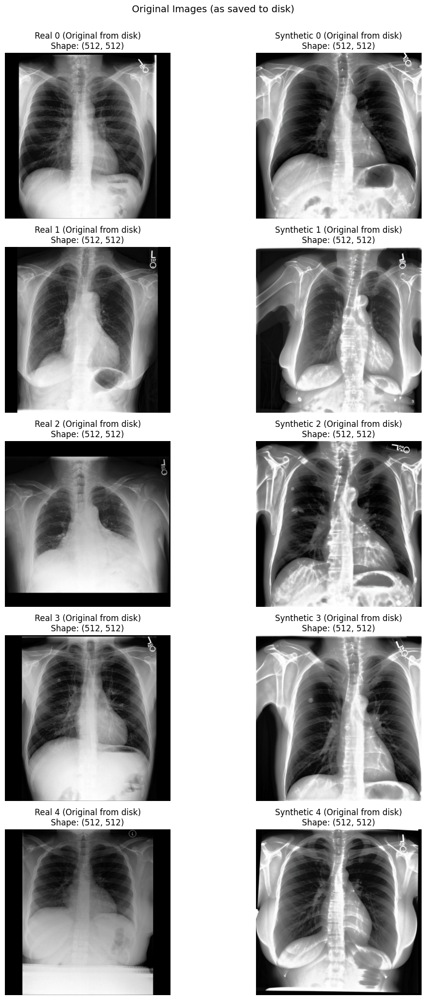

In [12]:
# Visualize original images (as saved to disk)
fig, axes = plt.subplots(num_pairs_to_show, 2, figsize=(12, 4 * num_pairs_to_show))
if num_pairs_to_show == 1:
    axes = axes.reshape(1, -1)

for i, pair in enumerate(image_pairs):
    # Real image (original from disk)
    axes[i, 0].imshow(pair['real_original'], cmap='gray')
    axes[i, 0].set_title(f"Real {pair['idx']} (Original from disk)\nShape: {pair['real_original'].size}")
    axes[i, 0].axis('off')
    
    # Synthetic image (original from disk)
    axes[i, 1].imshow(pair['synth_original'], cmap='gray')
    axes[i, 1].set_title(f"Synthetic {pair['idx']} (Original from disk)\nShape: {pair['synth_original'].size}")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.suptitle("Original Images (as saved to disk)", y=1.02, fontsize=14)
plt.show()


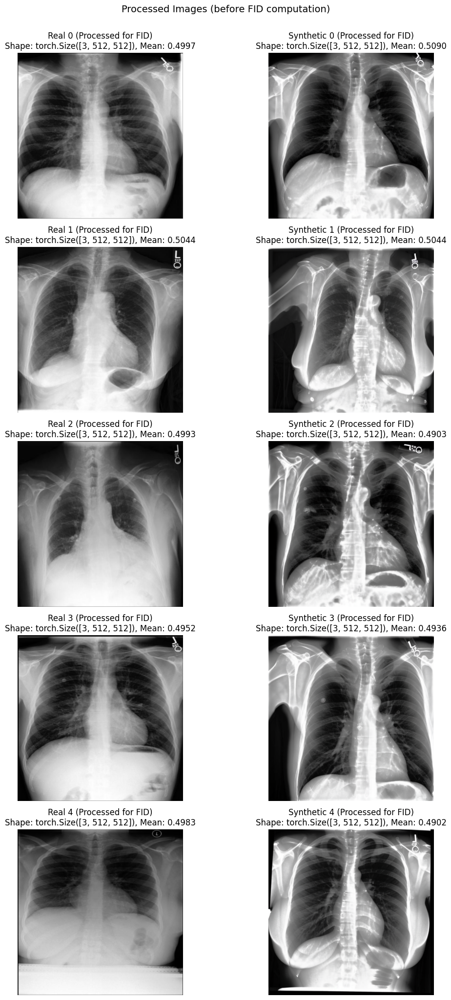

In [13]:
# Visualize processed images (before FID)
fig, axes = plt.subplots(num_pairs_to_show, 2, figsize=(12, 4 * num_pairs_to_show))
if num_pairs_to_show == 1:
    axes = axes.reshape(1, -1)

for i, pair in enumerate(image_pairs):
    # Real image (processed)
    real_t = pair['real_processed']
    real_display = real_t.permute(1, 2, 0).numpy()
    axes[i, 0].imshow(real_display, cmap='gray')
    axes[i, 0].set_title(f"Real {pair['idx']} (Processed for FID)\nShape: {real_t.shape}, Mean: {real_t.mean():.4f}")
    axes[i, 0].axis('off')
    
    # Synthetic image (processed)
    synth_t = pair['synth_processed']
    synth_display = synth_t.permute(1, 2, 0).numpy()
    axes[i, 1].imshow(synth_display, cmap='gray')
    axes[i, 1].set_title(f"Synthetic {pair['idx']} (Processed for FID)\nShape: {synth_t.shape}, Mean: {synth_t.mean():.4f}")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.suptitle("Processed Images (before FID computation)", y=1.02, fontsize=14)
plt.show()


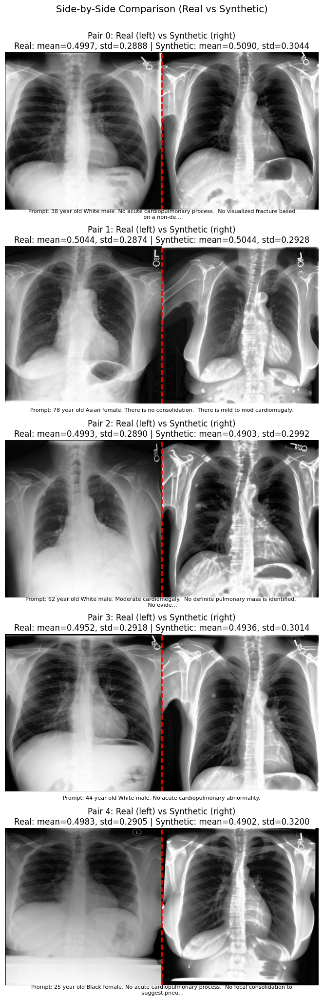

In [14]:
# Visualize side-by-side comparison
fig, axes = plt.subplots(num_pairs_to_show, 1, figsize=(16, 4 * num_pairs_to_show))
if num_pairs_to_show == 1:
    axes = [axes]

for i, pair in enumerate(image_pairs):
    real_t = pair['real_processed']
    synth_t = pair['synth_processed']
    
    # Create side-by-side comparison
    comparison = torch.cat([real_t, synth_t], dim=2)  # Concatenate horizontally
    comparison_display = comparison.permute(1, 2, 0).numpy()
    
    axes[i].imshow(comparison_display, cmap='gray')
    axes[i].axvline(x=512, color='red', linestyle='--', linewidth=2, label='Split')
    axes[i].set_title(
        f"Pair {pair['idx']}: Real (left) vs Synthetic (right)\n"
        f"Real: mean={real_t.mean():.4f}, std={real_t.std():.4f} | "
        f"Synthetic: mean={synth_t.mean():.4f}, std={synth_t.std():.4f}"
    )
    axes[i].axis('off')
    
    # Show prompt if available
    if pair['prompt']:
        prompt_short = pair['prompt'][:100] + "..." if len(pair['prompt']) > 100 else pair['prompt']
        axes[i].text(0.5, -0.05, f"Prompt: {prompt_short}", transform=axes[i].transAxes, 
                    ha='center', fontsize=8, wrap=True)

plt.tight_layout()
plt.suptitle("Side-by-Side Comparison (Real vs Synthetic)", y=1.02, fontsize=14)
plt.show()


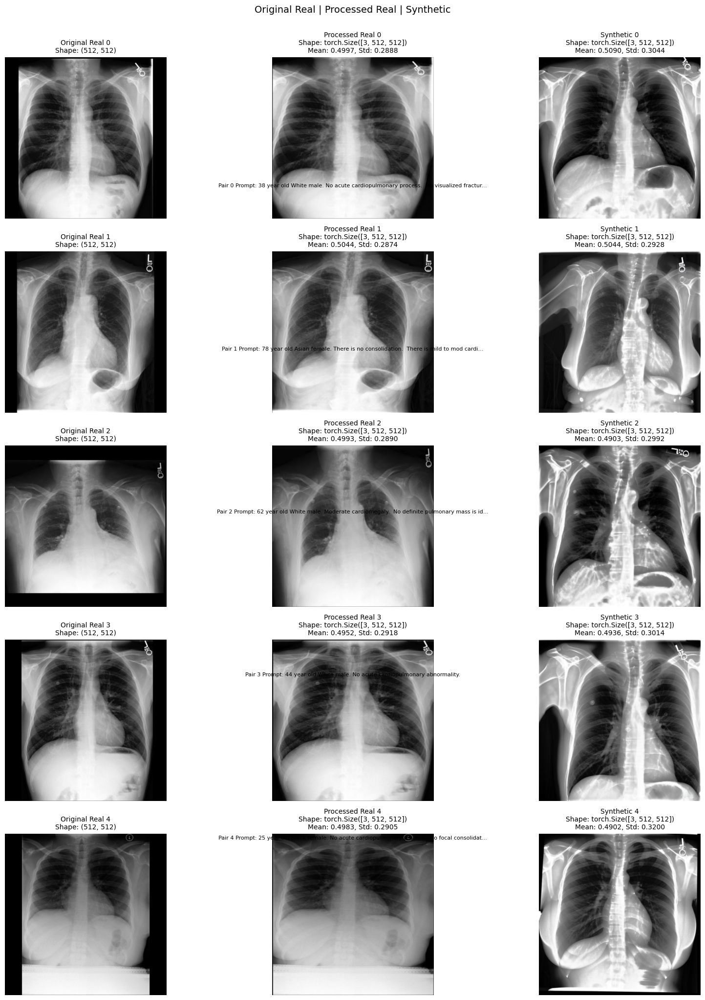

In [19]:
# Display 3 images side-by-side: Original Real, Processed Real, Synthetic
fig, axes = plt.subplots(num_pairs_to_show, 3, figsize=(18, 4 * num_pairs_to_show))
if num_pairs_to_show == 1:
    axes = axes.reshape(1, -1)

for i, pair in enumerate(image_pairs):
    # Original real image (as saved to disk)
    axes[i, 0].imshow(pair['real_original'], cmap='gray')
    axes[i, 0].set_title(f"Original Real {pair['idx']}\nShape: {pair['real_original'].size}", fontsize=10)
    axes[i, 0].axis('off')
    
    # Processed real image (after preprocessing for FID)
    real_t = pair['real_processed']
    real_display = real_t.permute(1, 2, 0).numpy()
    axes[i, 1].imshow(real_display, cmap='gray')
    axes[i, 1].set_title(
        f"Processed Real {pair['idx']}\nShape: {real_t.shape}\nMean: {real_t.mean():.4f}, Std: {real_t.std():.4f}", 
        fontsize=10
    )
    axes[i, 1].axis('off')
    
    # Synthetic image (original from disk, same as processed since synthetic doesn't need border cropping)
    synth_t = pair['synth_processed']
    synth_display = synth_t.permute(1, 2, 0).numpy()
    axes[i, 2].imshow(synth_display, cmap='gray')
    axes[i, 2].set_title(
        f"Synthetic {pair['idx']}\nShape: {synth_t.shape}\nMean: {synth_t.mean():.4f}, Std: {synth_t.std():.4f}", 
        fontsize=10
    )
    axes[i, 2].axis('off')
    
    # Add prompt below if available
    if pair['prompt']:
        prompt_short = pair['prompt'][:80] + "..." if len(pair['prompt']) > 80 else pair['prompt']
        fig.text(0.5, 1.0 - (i+1) * (1.0 / (num_pairs_to_show + 1)), 
                f"Pair {pair['idx']} Prompt: {prompt_short}", 
                ha='center', fontsize=8, wrap=True)

plt.tight_layout()
plt.suptitle("Original Real | Processed Real | Synthetic", y=1.02, fontsize=14)
plt.show()


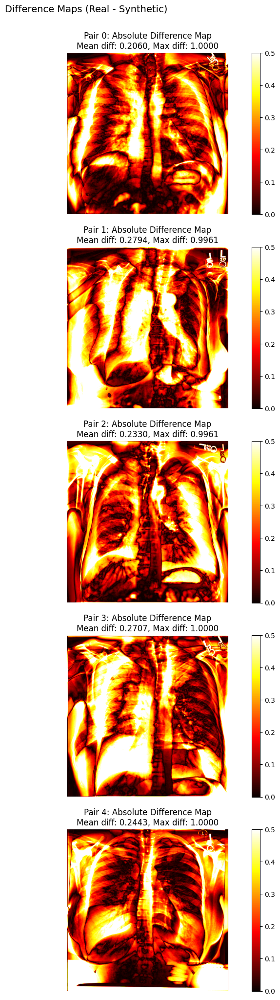

In [15]:
# Show difference map
fig, axes = plt.subplots(num_pairs_to_show, 1, figsize=(10, 4 * num_pairs_to_show))
if num_pairs_to_show == 1:
    axes = [axes]

for i, pair in enumerate(image_pairs):
    real_t = pair['real_processed']
    synth_t = pair['synth_processed']
    
    # Compute absolute difference
    diff = torch.abs(real_t - synth_t)
    diff_display = diff.mean(dim=0).numpy()  # Average across channels
    
    im = axes[i].imshow(diff_display, cmap='hot', vmin=0, vmax=0.5)
    axes[i].set_title(f"Pair {pair['idx']}: Absolute Difference Map\nMean diff: {diff.mean():.4f}, Max diff: {diff.max():.4f}")
    axes[i].axis('off')
    plt.colorbar(im, ax=axes[i])

plt.tight_layout()
plt.suptitle("Difference Maps (Real - Synthetic)", y=1.02, fontsize=14)
plt.show()


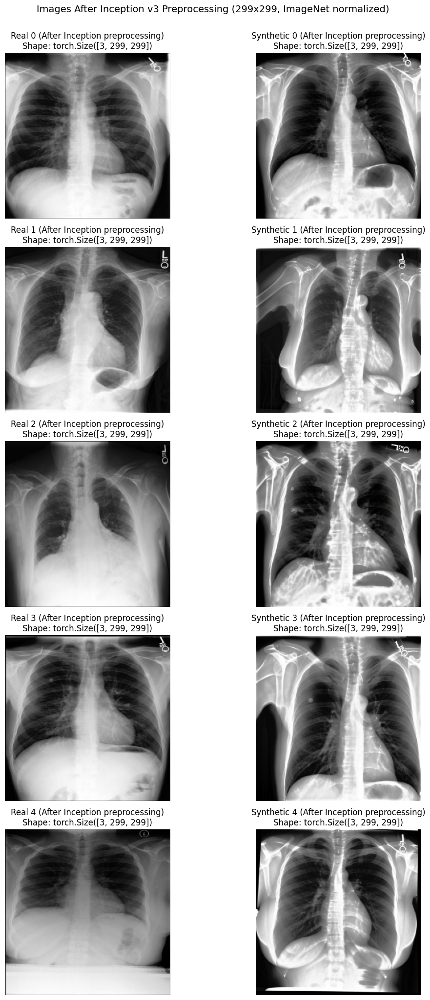

In [16]:
# Visualize after Inception preprocessing (299x299)
fig, axes = plt.subplots(num_pairs_to_show, 2, figsize=(12, 4 * num_pairs_to_show))
if num_pairs_to_show == 1:
    axes = axes.reshape(1, -1)

for i, pair in enumerate(image_pairs):
    real_t = pair['real_processed']
    synth_t = pair['synth_processed']
    
    # Apply Inception preprocessing
    real_inception = preprocess_for_inception(real_t)
    synth_inception = preprocess_for_inception(synth_t)
    
    # Denormalize for display (reverse ImageNet normalization)
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    
    real_display = (real_inception * std + mean).clamp(0, 1).permute(1, 2, 0).numpy()
    synth_display = (synth_inception * std + mean).clamp(0, 1).permute(1, 2, 0).numpy()
    
    axes[i, 0].imshow(real_display, cmap='gray')
    axes[i, 0].set_title(f"Real {pair['idx']} (After Inception preprocessing)\nShape: {real_inception.shape}")
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(synth_display, cmap='gray')
    axes[i, 1].set_title(f"Synthetic {pair['idx']} (After Inception preprocessing)\nShape: {synth_inception.shape}")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.suptitle("Images After Inception v3 Preprocessing (299x299, ImageNet normalized)", y=1.02, fontsize=14)
plt.show()


In [17]:
# Summary statistics across all pairs
print("=" * 80)
print("SUMMARY STATISTICS ACROSS ALL PAIRS")
print("=" * 80)

real_means = [pair['real_processed'].mean().item() for pair in image_pairs]
synth_means = [pair['synth_processed'].mean().item() for pair in image_pairs]
real_stds = [pair['real_processed'].std().item() for pair in image_pairs]
synth_stds = [pair['synth_processed'].std().item() for pair in image_pairs]

print(f"\nReal Images:")
print(f"  Mean: {np.mean(real_means):.4f} ± {np.std(real_means):.4f}")
print(f"  Std:  {np.mean(real_stds):.4f} ± {np.std(real_stds):.4f}")

print(f"\nSynthetic Images:")
print(f"  Mean: {np.mean(synth_means):.4f} ± {np.std(synth_means):.4f}")
print(f"  Std:  {np.mean(synth_stds):.4f} ± {np.std(synth_stds):.4f}")

print(f"\nDifference:")
print(f"  Mean diff: {np.mean(synth_means) - np.mean(real_means):.4f}")
print(f"  Std diff:  {np.mean(synth_stds) - np.mean(real_stds):.4f}")

if abs(np.mean(synth_means) - np.mean(real_means)) > 0.05:
    print(f"\n⚠️ WARNING: Significant mean difference detected!")
    print(f"   This may indicate preprocessing inconsistencies.")


SUMMARY STATISTICS ACROSS ALL PAIRS

Real Images:
  Mean: 0.4994 ± 0.0030
  Std:  0.2895 ± 0.0015

Synthetic Images:
  Mean: 0.4975 ± 0.0078
  Std:  0.3036 ± 0.0091

Difference:
  Mean diff: -0.0019
  Std diff:  0.0141


In [18]:
# Check for black borders in original images
print("=" * 80)
print("BLACK BORDER DETECTION")
print("=" * 80)

for i, pair in enumerate(image_pairs):
    real_orig = np.array(pair['real_original'])
    synth_orig = np.array(pair['synth_original'])
    
    # Check border pixels (first/last 10 pixels)
    real_border = np.concatenate([
        real_orig[:10, :].flatten(),
        real_orig[-10:, :].flatten(),
        real_orig[:, :10].flatten(),
        real_orig[:, -10:].flatten(),
    ])
    
    synth_border = np.concatenate([
        synth_orig[:10, :].flatten(),
        synth_orig[-10:, :].flatten(),
        synth_orig[:, :10].flatten(),
        synth_orig[:, -10:].flatten(),
    ])
    
    real_black_ratio = np.mean(real_border < 10)  # Pixels < 10 are considered black
    synth_black_ratio = np.mean(synth_border < 10)
    
    print(f"\nPair {pair['idx']}:")
    print(f"  Real border black ratio:    {real_black_ratio:.2%}")
    print(f"  Synthetic border black ratio: {synth_black_ratio:.2%}")
    
    if real_black_ratio > 0.3 and synth_black_ratio < 0.1:
        print(f"  ⚠️ Real image has significant black borders, synthetic doesn't!")


BLACK BORDER DETECTION

Pair 0:
  Real border black ratio:    78.06%
  Synthetic border black ratio: 27.19%

Pair 1:
  Real border black ratio:    59.52%
  Synthetic border black ratio: 0.19%
  ⚠️ Real image has significant black borders, synthetic doesn't!

Pair 2:
  Real border black ratio:    73.80%
  Synthetic border black ratio: 36.41%

Pair 3:
  Real border black ratio:    69.25%
  Synthetic border black ratio: 20.44%

Pair 4:
  Real border black ratio:    68.94%
  Synthetic border black ratio: 72.95%
